In [3]:
import cv2,string
import random
import numpy as np
import skimage.io as io
from skimage.exposure import histogram,equalize_hist
from skimage.color import rgb2gray
import matplotlib.pyplot as plt
from matplotlib.pyplot import bar
from scipy import fftpack
from PIL import Image
from skimage.util import random_noise


In [18]:
# Show the figures / plots inside the notebook
def show_images(images,titles=None):
    #This function is used to show image(s) with titles by sending an array of images and an array of associated titles.
    # images[0] will be drawn with the title titles[0] if exists
    # You aren't required to understand this function, use it as-is.
    n_ims = len(images)
    if titles is None: titles = ['(%d)' % i for i in range(1,n_ims + 1)]
    fig = plt.figure()
    n = 1
    for image,title in zip(images,titles):
        a = fig.add_subplot(1,n_ims,n)
        if image.ndim == 2: 
            plt.gray()
        plt.imshow(image)
        a.set_title(title)
        n += 1
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_ims)
    plt.show() 


In [22]:
#----------------------------------------------------------------------------------
#show histogram
def showHist(img):
    # An "interface" to matplotlib.axes.Axes.hist() method
    plt.figure()
    imgHist = histogram(img, nbins=256)
    
    bar(imgHist[1].astype(np.uint8), imgHist[0], width=0.8, align='center')



In [91]:
#best one (handles worst cases (img 6,7,8))
# Gamma Correction

def Gamma_Correction(img,c,gamma):
    
    g_img=np.array(c*(img / 255) ** gamma) ;
    return g_img
    

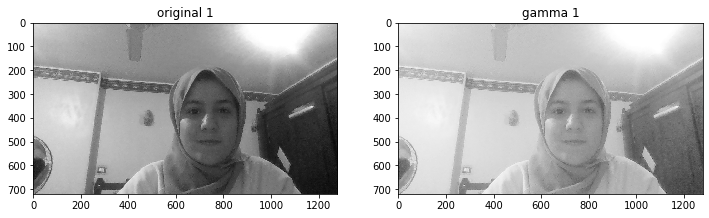

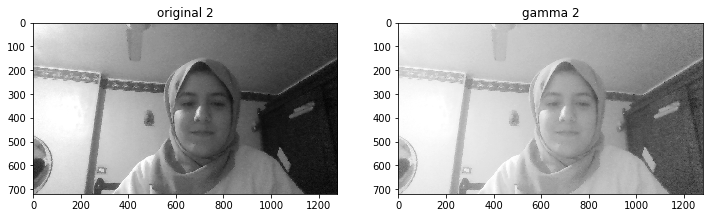

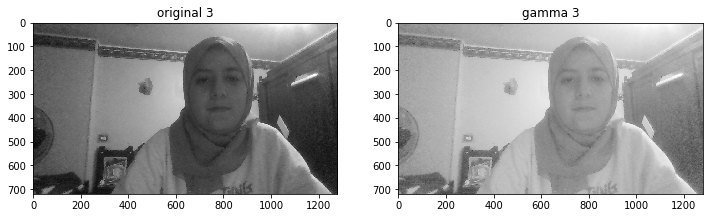

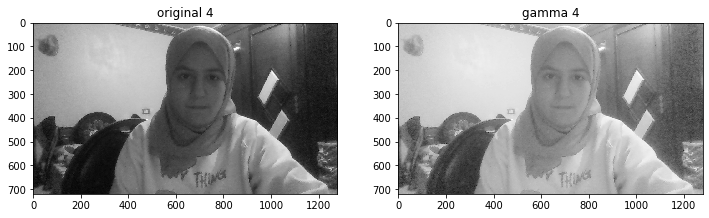

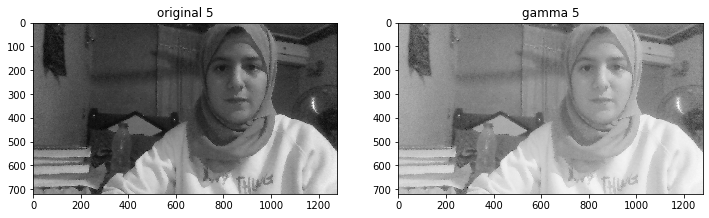

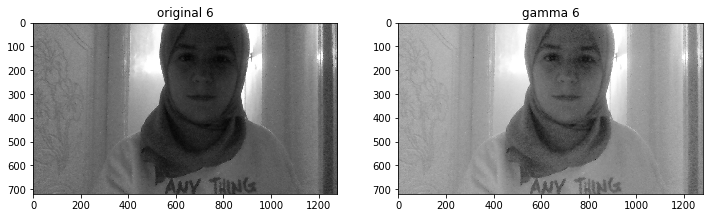

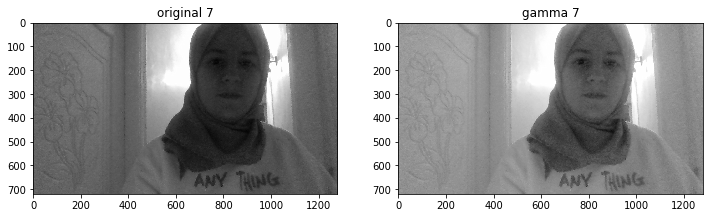

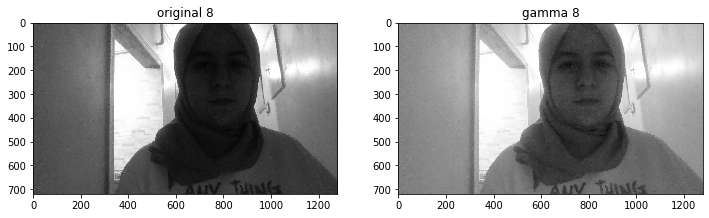

In [133]:
#best result
for i in range (1,9):
    img = io.imread('images/'+ str(i) +'.jpg')
    img=rgb2gray(img)    
    gamma=Gamma_Correction(img,1,0.4);
    show_images([img,gamma],['original '+str(i),'gamma '+str(i)])


In [78]:

#remove impulsive/random noise using median filter
def median_filter_algorithm(img, filter_size=(3,3)):
    if((filter_size[0] != filter_size[1]) or (filter_size[0]%2 == 0)):
        print('Please enter an odd square shape')
        return
    
    copied_img = img.copy()
    img_size = img.shape
    half_filter_size = filter_size[0]//2
    
    for row in range(img_size[0]):
        row_start = max(0, row - half_filter_size)
        row_end = min(img_size[0], row + half_filter_size)
        
        for col in range(img_size[1]):
            col_start = max(0, col - half_filter_size)
            col_end = min(img_size[1], col + half_filter_size)
            
            pixels_list = list(img[row_start:row_end+1, col_start:col_end+1].flatten())
            padded_pixels_list = pixels_list + [0]*(len(pixels_list) - filter_size[0]**2)
            padded_pixels_list.sort()
            copied_img[row, col] = padded_pixels_list[len(pixels_list)//2]
    
    return copied_img



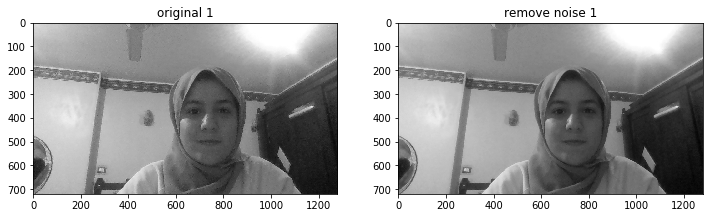

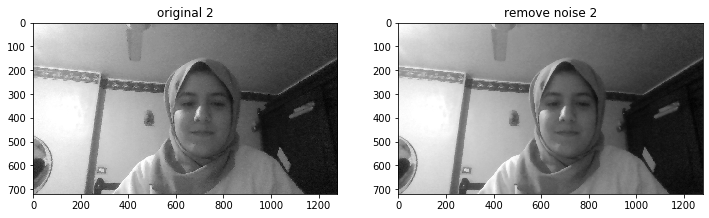

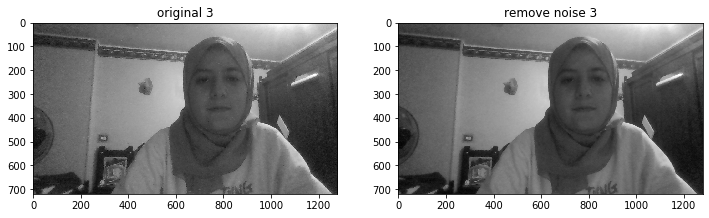

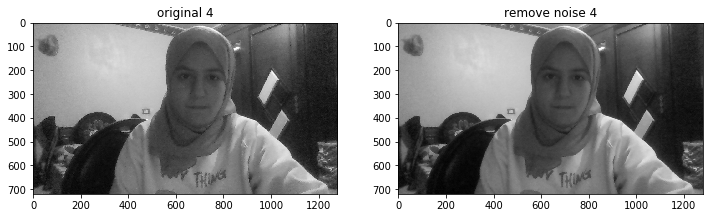

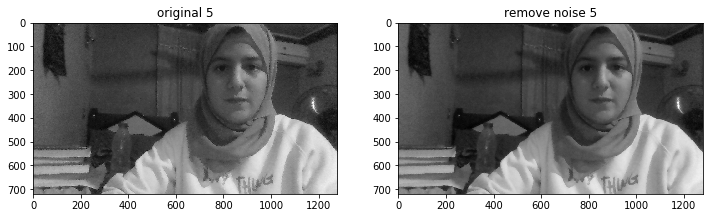

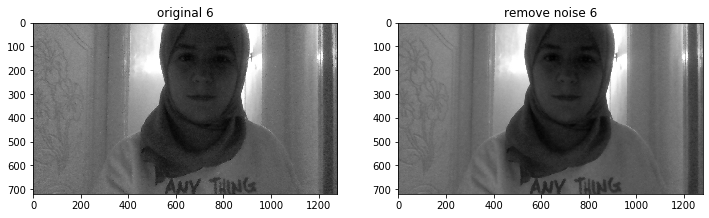

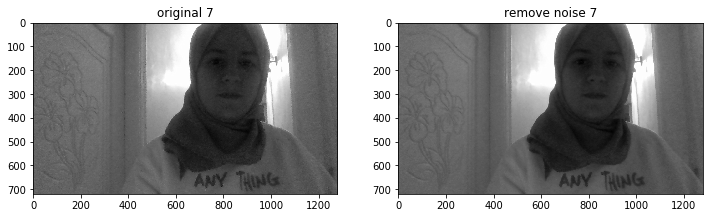

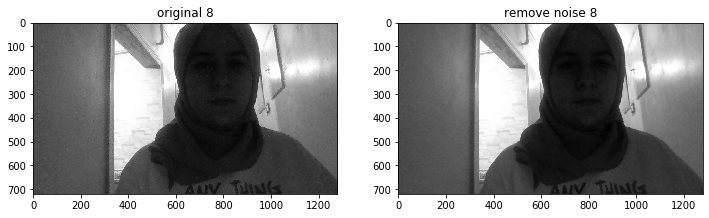

In [79]:
for i in range(1,9):
    img = io.imread('images/'+ str(i) +'.jpg')
    img=rgb2gray(img)
    rem_noise_img=median_filter_algorithm(img)
    show_images([img,rem_noise_img],['original '+str(i),'remove noise '+str(i)])


In [5]:
# #----------------------------------------------------------------------------------

# Equalization
def histogramEqualization(img,nbins=256):
#     img_eq = equalize_hist(img)
#     return img_eq
    img=img*255
    img=img.astype('uint8')
    values, keys= histogram(img)
    H_arr= np.zeros(nbins)
    for i in range (0, len(keys)):
        H_arr[keys[i]] = values[i]
    H_c= np.zeros(nbins)
    T_arr= np.zeros(nbins)

    for i in range (0, nbins):
        if(i==0):
            H_c[i]= H_arr[0]
        else:
            H_c[i]= H_c[i-1] + H_arr[i]
        T_arr[i]= round((nbins-1)*H_c[i]/float(img.shape[0]*img.shape[1]))
    filtered_img= np.copy(img)
    for row in range(0, img.shape[0]):
        for col in range(0, img.shape[1]):
            filtered_img[row,col]= T_arr[filtered_img[row,col]]
    return filtered_img
  



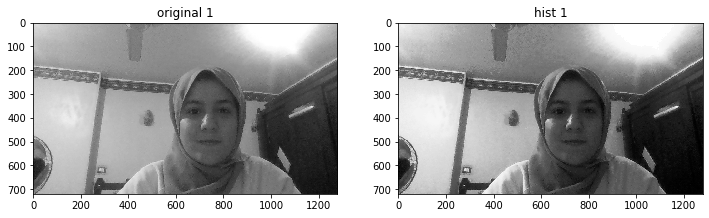

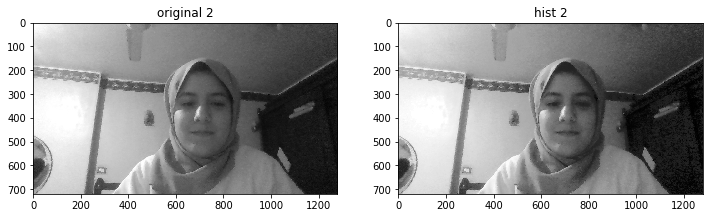

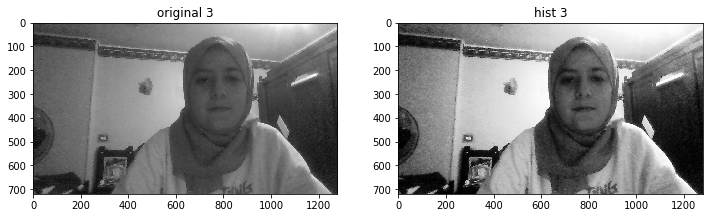

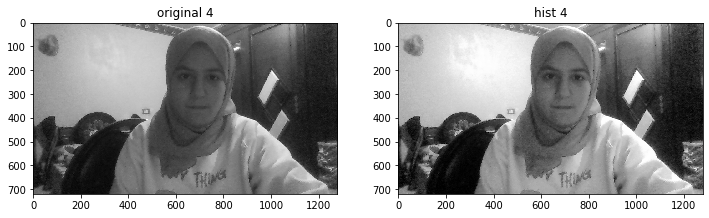

In [ ]:

for i in range(1,9):
    img = io.imread('images/'+ str(i) +'.jpg')
    img=rgb2gray(img)
    hist_img=histogramEqualization(img,256)
    show_images([img,hist_img],['original '+str(i),'hist '+str(i)])


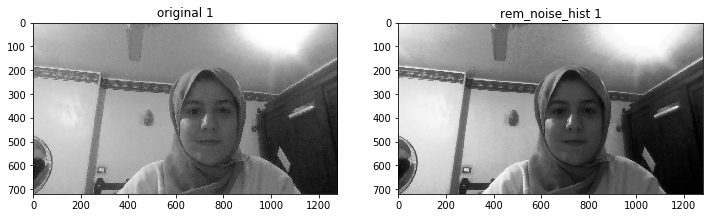

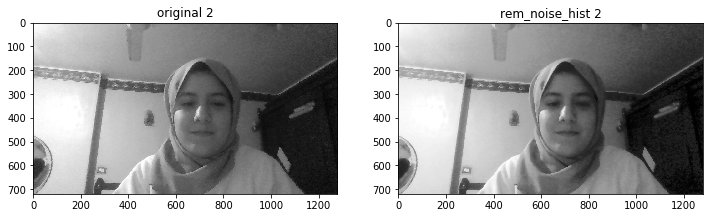

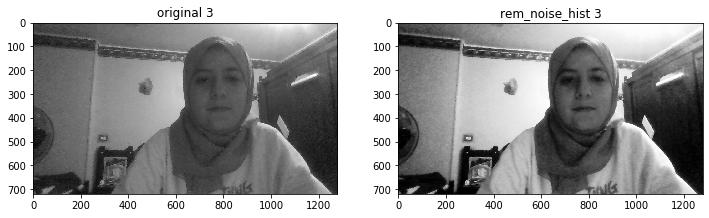

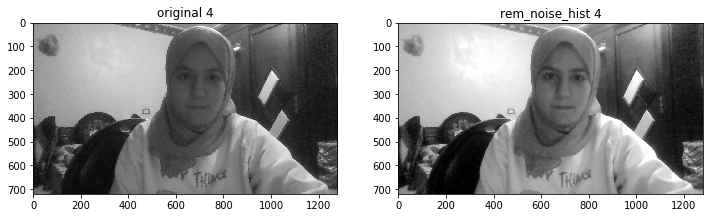

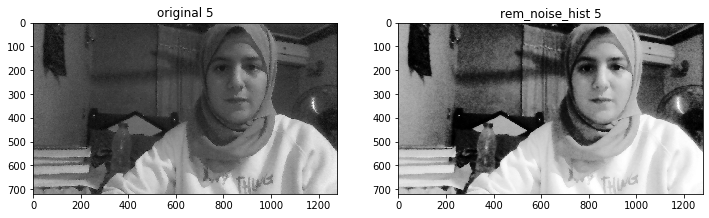

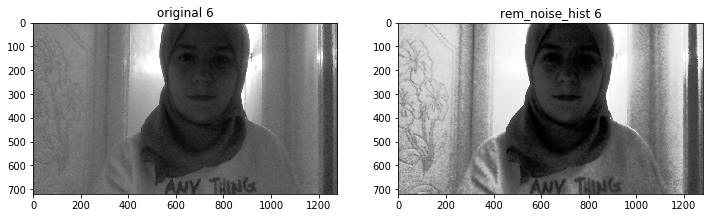

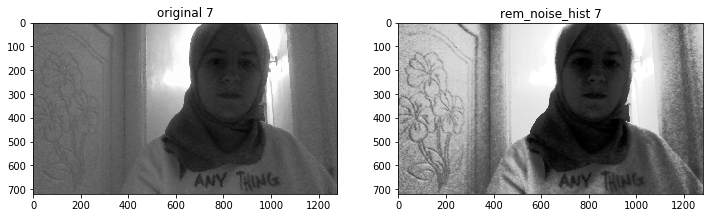

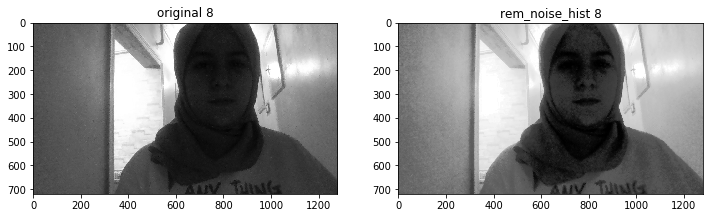

In [81]:
for i in range(1,9):
    img = io.imread('images/'+ str(i) +'.jpg')
    img=rgb2gray(img)
    hist_img=histogramEqualization(img)
    rem_noise_hist_img=median_filter_algorithm(hist_img)
    show_images([img,rem_noise_hist_img],['original '+str(i),'rem_noise_hist '+str(i)])



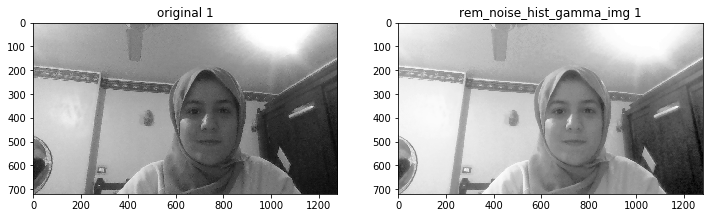

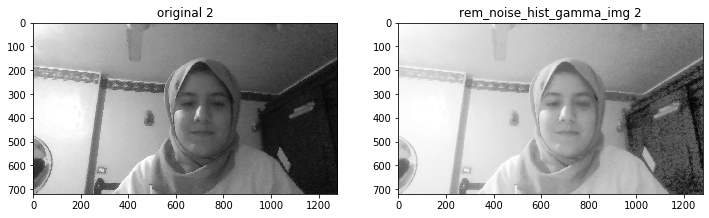

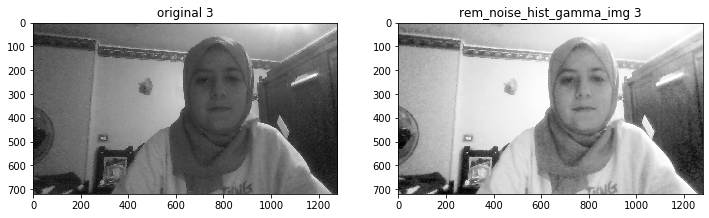

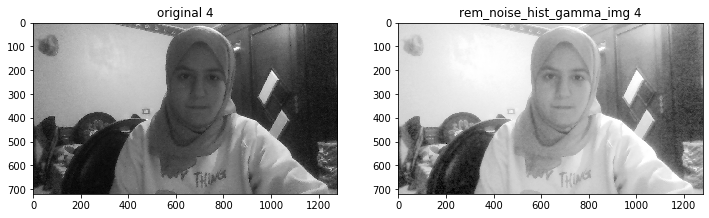

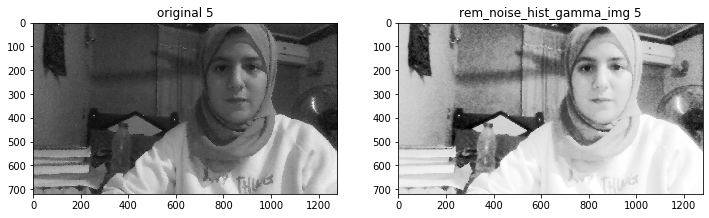

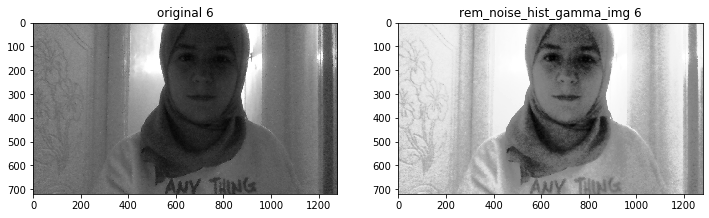

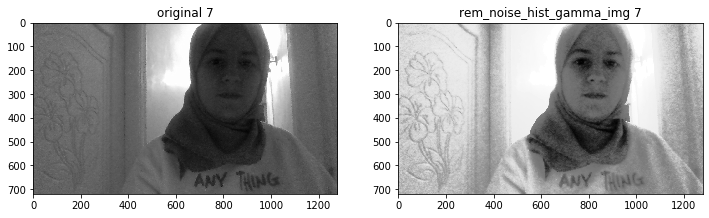

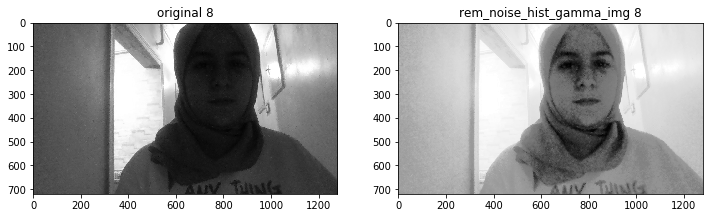

In [135]:
for i in range(1,9):
    img = io.imread('images/'+ str(i) +'.jpg')
    img=rgb2gray(img)
    rem_noise_img=median_filter_algorithm(img)
    rem_noise_hist_img=histogramEqualization(rem_noise_img)
    rem_noise_hist_gamma_img=Gamma_Correction(rem_noise_hist_img,1,0.5)
    show_images([img,rem_noise_hist_gamma_img],['original '+str(i),'rem_noise_hist_gamma_img '+str(i)])
    

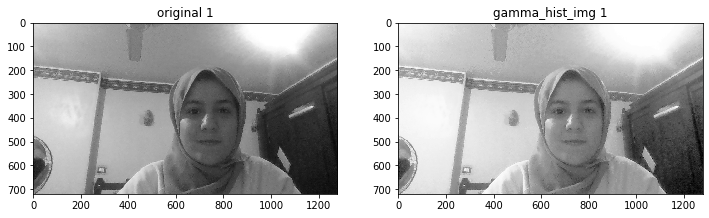

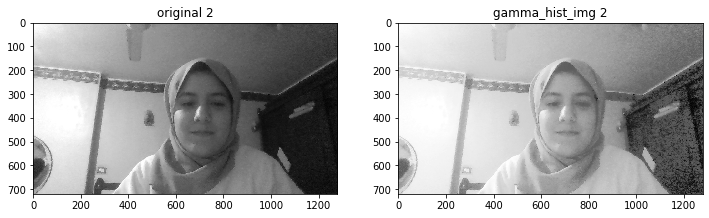

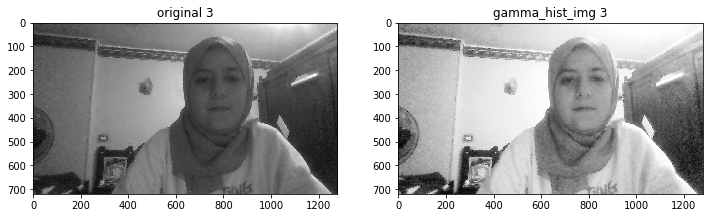

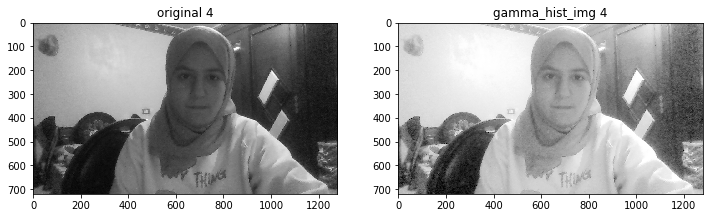

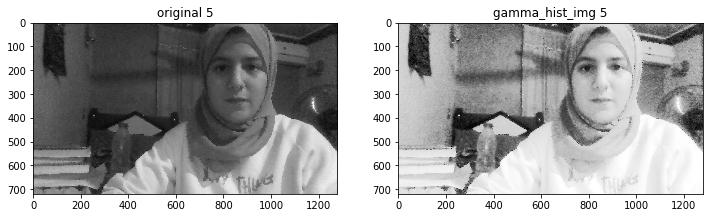

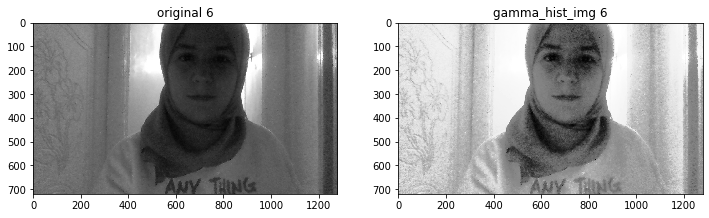

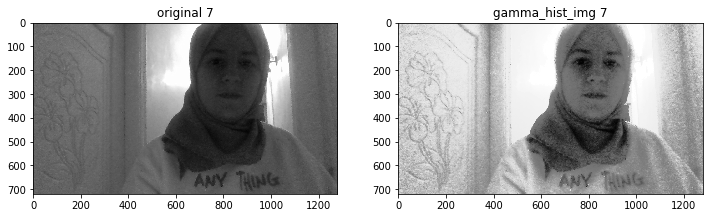

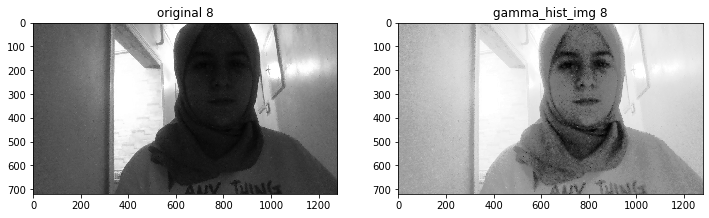

In [134]:
for i in range(1,9):
    img = io.imread('images/'+ str(i) +'.jpg')
    img=rgb2gray(img)
    hist_img= histogramEqualization(img)
    gamma_hist_img=Gamma_Correction(hist_img,1,0.5)
    show_images([img,gamma_hist_img],['original '+str(i),'gamma_hist_img '+str(i)])


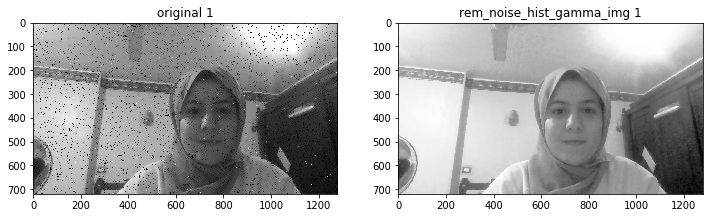

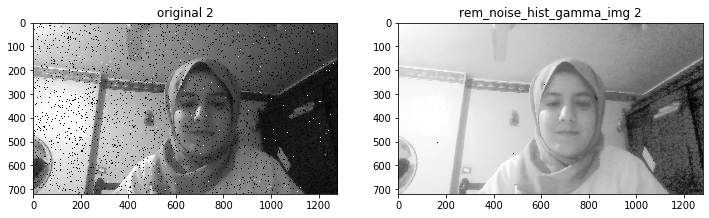

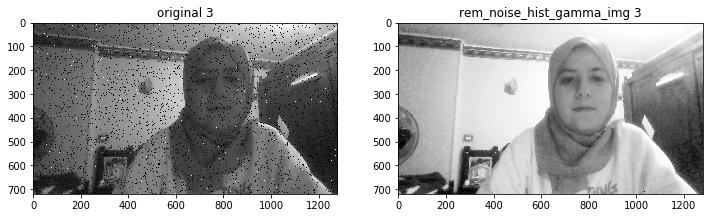

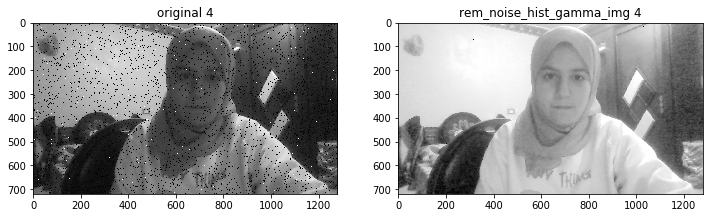

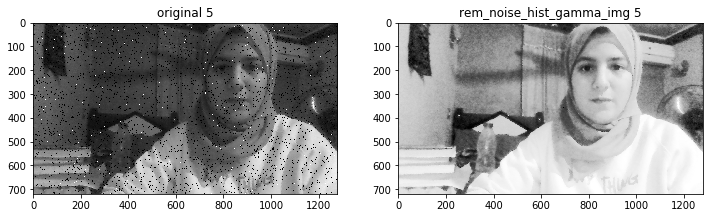

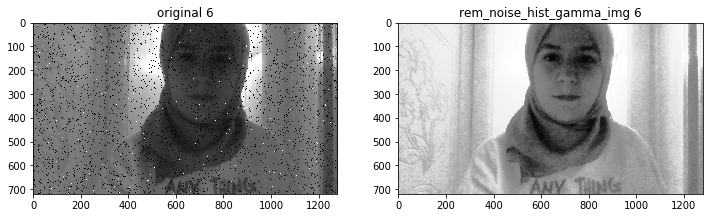

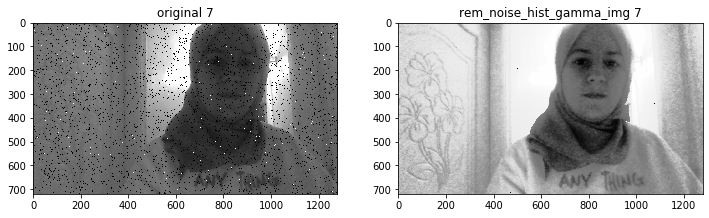

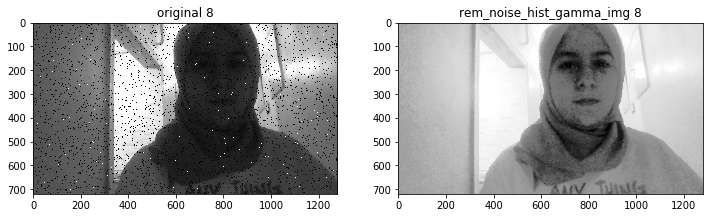

In [138]:
#apply on impulsive noisy image

for i in range(1,9):
    img = io.imread('images/'+ str(i) +'.jpg')
    img=rgb2gray(img)
    noisy_img = random_noise(img, 's&p', salt_vs_pepper=0.05)
    rem_noise_img=median_filter_algorithm(noisy_img)
    rem_noise_hist_img=histogramEqualization(rem_noise_img)
    rem_noise_hist_gamma_img=Gamma_Correction(rem_noise_hist_img,1,0.5)
    show_images([noisy_img,rem_noise_hist_gamma_img],['original '+str(i),'rem_noise_hist_gamma_img '+str(i)])
    

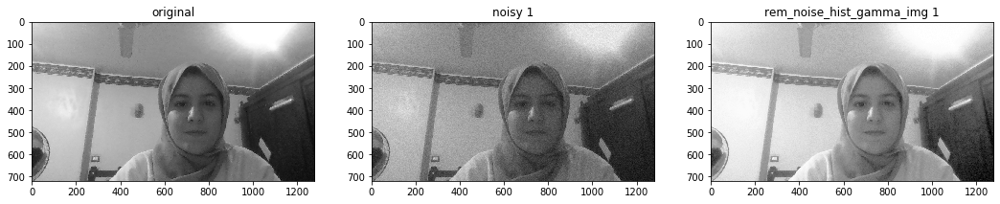

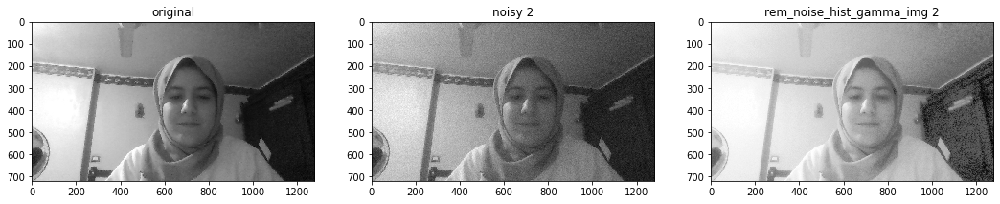

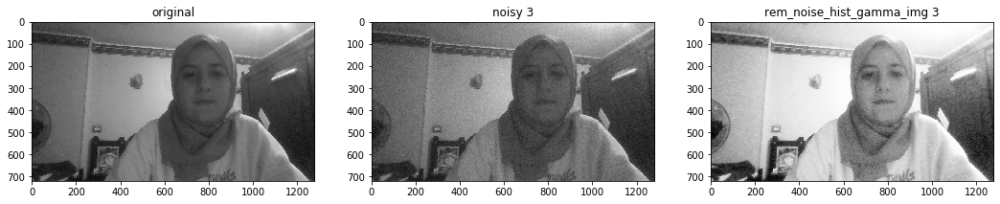

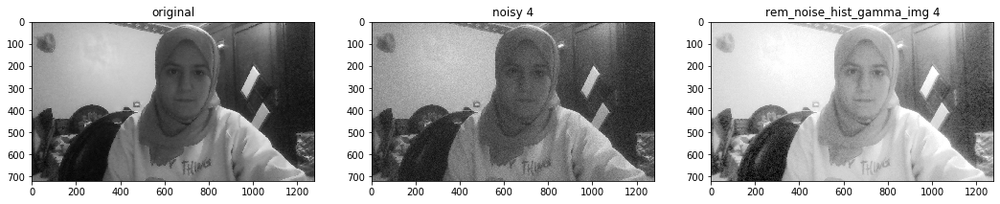

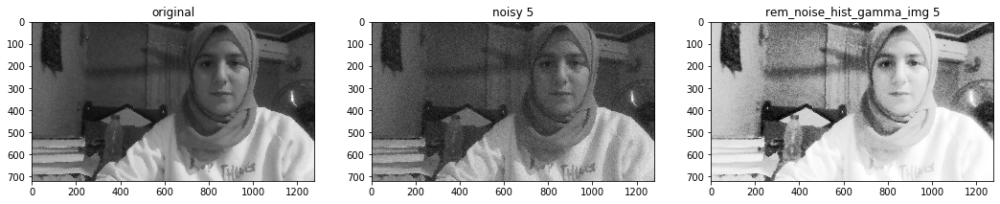

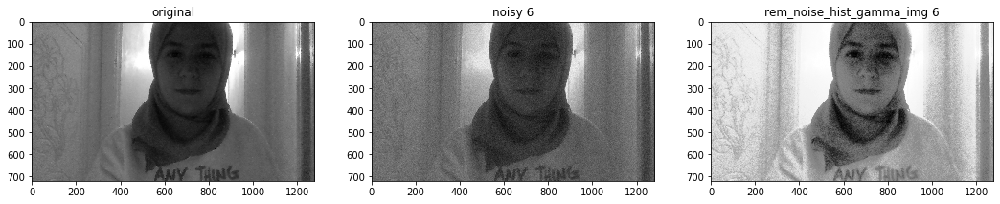

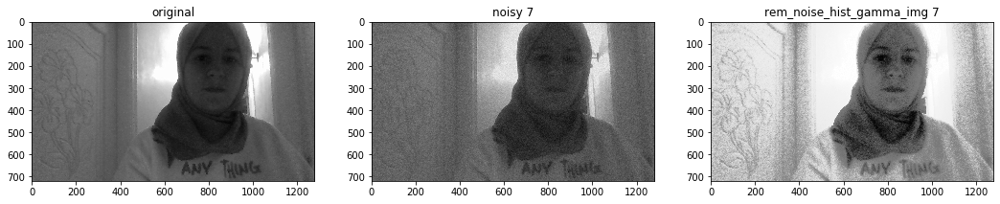

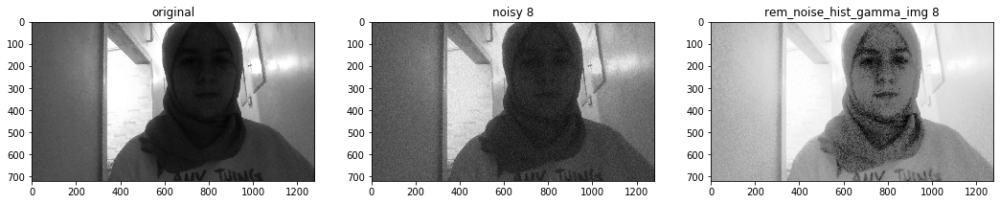

In [149]:
#apply on additive noisy image

for i in range(1,9):
    img = io.imread('images/'+ str(i) +'.jpg')
    img=rgb2gray(img)
    
    noise = np.random.normal(0,0.03,img.shape)
    noisy_img = noise + img
#     show_images([noisy_img])
    
    rem_noise_img=median_filter_algorithm(noisy_img)
    rem_noise_hist_img=histogramEqualization(rem_noise_img)
    rem_noise_hist_gamma_img=Gamma_Correction(rem_noise_hist_img,1,0.5)
    show_images([img,noisy_img,rem_noise_hist_gamma_img],
                ['original','noisy '+str(i),'rem_noise_hist_gamma_img '+str(i)])
  



In [2]:

#----------------------------------------------------------------------------------
def frames():
    cap = cv2.VideoCapture(0)
    fourcc = cv2.VideoWriter_fourcc(*'XVID')#type of extension (I think)
    n1 = random.random()

    #take 20 frames/captures per second
    #put the size of the new video
    out_vid = cv2.VideoWriter('out1'+str(n1)+'.avi',fourcc,20.0,
    ( 640,480 )
    )

    while (True):#or use cap.isOpened
        ret, frame  = cap.read() 
    #if it can read from cap(true) it will save it in frame
        
        if ret == True:

            # height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT )
            # weidth = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
            # print(height) #480
            # print(weidth ) #640

            out_vid.write(frame)#save in colors

            gray = cv2.cvtColor(frame,cv2.COLOR_BGR2GRAY )#its arguements are: 1. name of the source 
            #2. destination to be capturing gray not colored
            cv2.imshow('gray frame', gray)

            S = 10  # number of characters in the string.  
            ran_str = ''.join(random.choices(string.ascii_uppercase + string.digits, k = S))  
            i = random.randrange(0, 9000, 1)

            #save pictures/frames from the video
            cv2.imwrite('images/image'+ ran_str +'%00002i.jpg' %i, gray)
            

            if ( cv2.waitKey(1) & 0xFF == ord('q') ):
                #to wait for the user input & fro 64 bit machine == q key is pressed
                break
        else:
            break
        #break the loop

    cap.release()
    cv2.destroyAllWindows()

In [4]:
frames()